# Introduction
Welcome to Lab 2, in this lab we will take our first steps into applying ML to satellite data, using landcover analysis as our primary goal.

As covered in Lecture 2, landcover classification is the quintessential remote sensing task in the civil sector. The LandSat programme (Lecture 3) was originally developed in large part to enable the USA to monitor landcover more easily for a range of agricultral, govermental and finacial problemsets. It remains a primary task for governments and companies around the world.

This is a pixel-wise ML task. We will apply two methods, both of which are available in GEE as ready-to-go algorithms. In this instance we are happy to go with built-in as it allows us to become familiar with an end-to-end GEE ML workflow without getting bogged down in technical detail. No need to re-invent the wheel unless you are going to the [moon](https://www.nasa.gov/feature/ames/artemis-moon-rover-s-wheels-are-ready-to-roll/).

Remember that this is a set of exercises and tutorials that escalate in difficulty. Always show your working and do not neccesarily expect to get full marks on everything.

Use the resources available to you outside of this material. I expect you to search for concepts or terms you do not understand and to look at the documentation of the code packages that we are using in the first instance of getting stuck. But do then of course ask us for help in the lab and on EdDiscussion.
_______________________________________________________________________________

# Set up

In [1]:
# Install libs if needed, note the --quiet option means a lot less annoying info than as Lab 1 when we did the same!
!pip install geemap --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 24.3 MB/s eta 0:00:00


In [2]:
# Set up GEE API
import ee
ee.Authenticate()
ee.Initialize(project='geog761-504211') #<- Remember to change this to your own project's name!

In [3]:
# Import other libs
import geemap
import geopandas as gpd
import pandas as pd

# Define Area of Interest (AOI)

In [4]:
# Define area of interest (e.g., Wellington, NZ)
aoi = ee.Geometry.Rectangle([174.6, -41.4, 174.9, -41.2])
Map = geemap.Map(center=[-41.3, 174.75], zoom=10)
Map.addLayer(aoi, {}, 'AOI')

# Visualize on the map to check got it right... (always a good idea)
Map

Map(center=[-41.3, 174.75], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright…

# Load and Cloud Mask Imagery from Earth Engine

In [21]:
# Set up your filter Sentinel-2 imagery
# A function that masks clouds in your S2 images via QA band
def mask_s2_clouds(image):
    qa = image.select('QA60')
    cloudBitMask = 1 << 10
    cirrusBitMask = 1 << 11
    mask = qa.bitwiseAnd(cloudBitMask).eq(0).And(
           qa.bitwiseAnd(cirrusBitMask).eq(0))
    return image.updateMask(mask).divide(10000).select(['B2', 'B3', 'B4', 'B8'])

# Now build the clean collection with selected bands
s2 = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
      .filterBounds(aoi)
      # .filterDate('2021-01-01', '2021-12-31')
      .filterDate('2020-01-01', '2020-12-31') # 2021 > 2020
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10))
      .map(mask_s2_clouds)
      .median() #<- think about this step and what it is doing to your image when you build your single composite from the image collection
      .clip(aoi))

(1) What other mathematical [compositing](https://developers.google.com/earth-engine/guides/ic_composite_mosaic) approaches could you take when building your single image from the filtered image collection you create in the cell above? Hint: you currently are doing a 'median-composite'. (3 pts)

In [22]:
# Set up the visualisation and then once again check it has worked, stacking layers in a sensible order
Map = geemap.Map(center=[-41.3, 174.75], zoom=11) #<- reset the map object to clear out other layers from earlier cells
Map.addLayer(s2, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 0.3}, 'S2 RGB')
Map.addLayer(aoi, {'color': 'red'}, 'AOI')
Map

Map(center=[-41.3, 174.75], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright…

________________________________________________________________________________

# Training data

We are going to train our data using the European Space Agency (ESA) world landcover map. Given that this is derived from satellite data our logic is at risk of becoming a little circular here. But as a training exercise it is a good way to have easy to access training data of the right size and type to apply to our image.

There are a wide range of landcover datasets in the GEE catalogue that you can use for this purpose:
*   https://developers.google.com/earth-engine/datasets/tags/landuse-landcover

First, we will load in the landcover map we will use to create our training dataset (https://developers.google.com/earth-engine/datasets/catalog/ESA_WorldCover_v100):



Next we need to use our landcover map to [sample](https://developers.google.com/earth-engine/apidocs/ee-image-sample) the Sentinel 2 image, associating each pixel of a given landcover with the spectral band values 'beneath' it.

In [24]:
# Define valid WorldCover classes (10 to 100, spaced by 10)
valid_classes = ee.List.sequence(10, 100, 10)

# Need to change this to sequential list to avoid the algs thiniing there are 99 classes rather than 9
remap_to = ee.List.sequence(1, 10)

# Load landcover map
landcover = ee.Image('ESA/WorldCover/v100/2020').select('Map').clip(aoi)

# Remap labels: create a new band with remapped values (10 → 1, ..., 100 → 10)
landcover_remapped = landcover.remap(valid_classes, remap_to).rename('Map_remapped')

(2) What year of data was this landcover map (accessed in the cell above) created on? (1 pt)

In [25]:
# Add landcover original and remapped as bands to Sentinel-2 image
training_data = s2.addBands(landcover_remapped)

Let's inspect the resulting training dataset and make sure that you understand what you have built here.

We are going to:
- Print the first few rows (client-side).
- Check the number of samples per class (server-side with reduceColumns).

This may take a little time to run as we request data both client and server side.

In [26]:
# Sample the image
bands = ['B2', 'B3', 'B4', 'B8']
sample = training_data.select(bands + ['Map_remapped']).sample(
    region=aoi,
    scale=10,
    numPixels=5000,
    seed=2,
    geometries=True)

# Print first 10 sample points (client-side)
first_10 = sample.limit(10).getInfo()

print('\nFirst 10 training samples:')
for i, feature in enumerate(first_10['features']):
    props = feature['properties']
    print(f"Sample {i+1}: Class={props['Map_remapped']}, B2={props['B2']}, B3={props['B3']}, B4={props['B4']}, B8={props['B8']}")

# Count number of samples per class (server-side)
class_counts = sample.reduceColumns(
    reducer=ee.Reducer.frequencyHistogram(),
    selectors=['Map_remapped'])

print('\nClass distribution in sample:')
print(class_counts.getInfo())



First 10 training samples:
Sample 1: Class=8, B2=0.02669999934732914, B3=0.028599999845027924, B4=0.007199999876320362, B8=0.006099999882280827
Sample 2: Class=8, B2=0.037300001829862595, B3=0.024399999529123306, B4=0.007300000172108412, B8=0.0034000000450760126
Sample 3: Class=1, B2=0.017899999395012856, B3=0.03869999945163727, B4=0.023983333259820938, B8=0.24060000479221344
Sample 4: Class=8, B2=0.04190000146627426, B3=0.03344999998807907, B4=0.007249999791383743, B8=0.0034000000450760126
Sample 5: Class=1, B2=0.014720000326633453, B3=0.02461666613817215, B4=0.01642500050365925, B8=0.28949999809265137
Sample 6: Class=5, B2=0.11460000276565552, B3=0.10014999657869339, B4=0.11429999768733978, B8=0.15520000457763672
Sample 7: Class=1, B2=0.03290000185370445, B3=0.0544000007212162, B4=0.050850000232458115, B8=0.2685000002384186
Sample 8: Class=8, B2=0.041600000113248825, B3=0.02876250073313713, B4=0.009920000098645687, B8=0.0045111109502613544
Sample 9: Class=8, B2=0.03420000150799751, 

(3) What type of landcover is being sampled in sample number 2 of the dataset? Make sure your random seed is set to 2 in the sampling code so that you get the same answer as me. (1 pt)

We are now ready to start machine learning on classifying the landcover of Wellington!
________________________________________________________________________________

# Random Forest Classification for Landcover
Let us do machine learning properly and first apply a 70/20/10 split that allows us to produce some accuracy statistics.

In [27]:
# Add random column
sample = sample.randomColumn('random')

# Split
train = sample.filter(ee.Filter.lt('random', 0.7))
valid = sample.filter(ee.Filter.And(ee.Filter.gte('random', 0.7), ee.Filter.lt('random', 0.9)))
test = sample.filter(ee.Filter.gte('random', 0.9))

Our next task is to set up a classifier object, followed by applying it to the image using the .classify operator. This operator hides a LOT of behind the scenes plumbing from Google.

We use the [GEE Random Forest](https://developers.google.com/earth-engine/apidocs/ee-classifier-smilerandomforest) model that they have pre-built for us. Specifying the number of trees to use is the only variable we must set. Othe variables are available, read the docs!

In [28]:
# Train the RF model
classifier = ee.Classifier.smileRandomForest(numberOfTrees=100).train(
    features=train,
    classProperty='Map_remapped',
    inputProperties=bands)

With the model trained, we just apply it simply using the '.classify' operator.

In [29]:
# Classify image
classified = s2.select(bands).classify(classifier)

Let's visualize what we have just made!

In [30]:
# Classified image viz, fresh set up again to make sure we have exactly what we want displayed.
Map = geemap.Map()
Map.centerObject(aoi, 10)
Map.addLayer(classified.randomVisualizer(), {}, 'Classified')
Map.addLayer(landcover_remapped.randomVisualizer(), {} ,'ESA Landcover')
Map

Map(center=[-41.300046246343555, 174.75000000000097], controls=(WidgetControl(options=['position', 'transparen…

In [32]:
# Fixed palette
palette = [
    '006400',  # 1  Tree cover
    'ffbb22',  # 2  Shrubland
    'ffff4c',  # 3  Grassland
    'f096ff',  # 4  Cropland
    'fa0000',  # 5  Built-up
    'b4b4b4',  # 6  Bare/sparse
    'f0f0f0',  # 7  Snow and ice
    '0064c8',  # 8  Water
    '0096a0',  # 9  Herbaceous wetland
    'fae6a0',  # 10 Moss and lichen
]

vis = {'min': 1, 'max': 10, 'palette': palette}

Map = geemap.Map()
Map.centerObject(aoi, 11)
Map.addLayer(s2, {'bands': ['B4','B3','B2'], 'min': 0, 'max': 0.3}, 'S2 RGB (reference)')
Map.addLayer(landcover_remapped, vis, 'ESA Landcover')
Map.addLayer(classified, vis, 'RF Classified')
Map

Map(center=[-41.300046246343555, 174.75000000000097], controls=(WidgetControl(options=['position', 'transparen…

(4) Look at the ESA landcover map and our resulting random forest classified Sentinel 2 image map. How are they different and what might be some causes of this difference? (5 pts)

Finally, we will apply our test data split and produce the [summary statistics](https://developers.google.com/machine-learning/crash-course/classification/accuracy-precision-recall) that we need to make smart choices about our training approach.

In [33]:
from sklearn.metrics import confusion_matrix, classification_report
import pandas as pd


# Validate
# validated = valid.classify(classifier, 'predicted')
# test
validated = test.classify(classifier, 'predicted')   # valid → test

# Function to export data for confusion matrix
def fc_to_lists(fc, classProp, predProp):
    values = fc.aggregate_array(classProp).getInfo()
    preds = fc.aggregate_array(predProp).getInfo()
    return values, preds

# Get predicted vs actual from validation set
y_true, y_pred = fc_to_lists(validated, 'Map_remapped', 'predicted')

# Labels for original classes
label_map = {i + 1: valid_classes.get(i).getInfo() for i in range(10)}
label_names = [label_map[i + 1] for i in range(10)]

# Confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=list(range(1, 11)))
report = classification_report(y_true, y_pred, labels=list(range(1, 11)), target_names=[str(l) for l in label_names])

# Pretty-print
print("Confusion Matrix:")
print(pd.DataFrame(cm, index=[f"Actual {l}" for l in label_names],
                       columns=[f"Pred {l}" for l in label_names]))
print("\nClassification Report:")
print(report)

Confusion Matrix:
            Pred 10  Pred 20  Pred 30  Pred 40  Pred 50  Pred 60  Pred 70  \
Actual 10       114        0       20        0        0        0        0   
Actual 20         0        0        0        0        0        0        0   
Actual 30        19        0       76        0        2        0        0   
Actual 40         0        0        0        0        0        0        0   
Actual 50         2        0        7        0       17        1        0   
Actual 60         0        0        4        0        3        1        0   
Actual 70         0        0        0        0        0        0        0   
Actual 80         1        0        0        0        0        0        0   
Actual 90         0        0        0        0        0        0        0   
Actual 100        0        0        0        0        0        0        0   

            Pred 80  Pred 90  Pred 100  
Actual 10         0        0         0  
Actual 20         0        0         0  
Actual 30  

(5) Exercise: modify the code so that you feed into your random forest classifier that has been trained on 2020 data, on other years of Sentinel 2 data than 2020. Produce a publication quality figure that presents the following:
*   Landcover maps of Wellington for 2018, 2022 and 2024
*   The Test accuracy averages of the RF classifier for 2020.
*   Include a sentence in your figure caption that explains why you cannot state the accuracy of the classifier for years other than 2020.

(15 pts)
_______________________________________________________________________________


In [34]:
# Check if there are any usable images for each year.
def build_s2(year):
    return (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
            .filterBounds(aoi)
            .filterDate(f'{year}-01-01', f'{year}-12-31')
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10))
            .map(mask_s2_clouds)
            .median()
            .clip(aoi))

years = [2018, 2022, 2024]
classified_by_year = {}
image_counts = {}

for y in years:
    n = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
         .filterBounds(aoi).filterDate(f'{y}-01-01', f'{y}-12-31')
         .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10)).size().getInfo())
    image_counts[y] = n
    print(f"{y}: {n} Scenery available in images")
    classified_by_year[y] = build_s2(y).select(bands).classify(classifier)

2018: 16 景可用影像
2022: 48 景可用影像
2024: 77 景可用影像


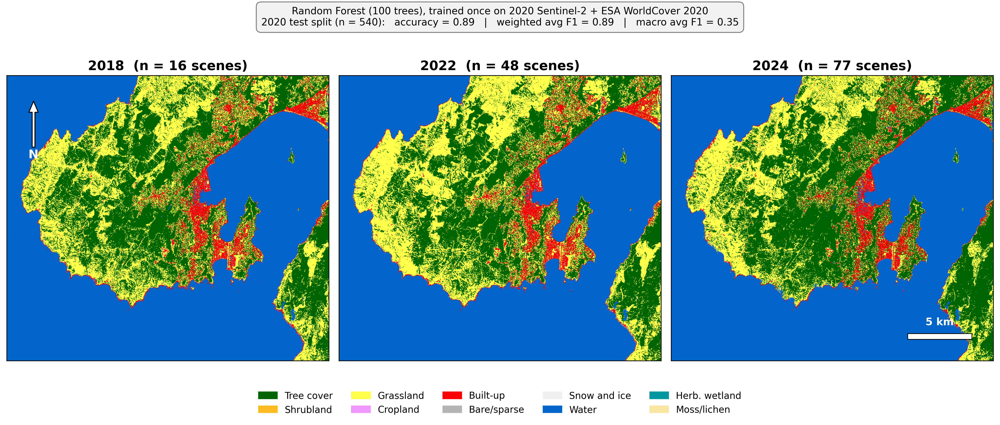

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [35]:

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import urllib.request, tempfile
import matplotlib.image as mpimg
import numpy as np

palette = ['006400','ffbb22','ffff4c','f096ff','fa0000',
           'b4b4b4','f0f0f0','0064c8','0096a0','fae6a0']
class_names = ['Tree cover','Shrubland','Grassland','Cropland','Built-up',
               'Bare/sparse','Snow and ice','Water','Herb. wetland','Moss/lichen']

xmin, ymin, xmax, ymax = 174.6, -41.4, 174.9, -41.2

fig, axes = plt.subplots(1, 3, figsize=(15, 6), dpi=300)

for ax, y in zip(axes, years):
    url = classified_by_year[y].getThumbURL({
        'dimensions': 1000, 'region': aoi, 'format': 'png',
        'min': 1, 'max': 10, 'palette': palette})
    with tempfile.NamedTemporaryFile(suffix='.png') as f:
        urllib.request.urlretrieve(url, f.name)
        ax.imshow(mpimg.imread(f.name), extent=[xmin, xmax, ymin, ymax])
    ax.set_title(f'{y}  (n = {image_counts[y]} scenes)', fontsize=14, fontweight='bold')
    ax.set_aspect(1 / np.cos(np.radians(41.3)))   # Latitude correction
    ax.set_xticks([]); ax.set_yticks([])

# Compass (first image)
axes[0].annotate('N', xy=(xmin+0.025, ymax-0.018), xytext=(xmin+0.025, ymax-0.058),
                 arrowprops=dict(facecolor='white', edgecolor='black',
                                 width=3, headwidth=10),
                 ha='center', fontsize=13, color='white', fontweight='bold')

# Scale (last image)
km_per_deg = 111.32 * np.cos(np.radians(41.3))
bar = 5 / km_per_deg
axes[2].add_patch(plt.Rectangle((xmax-bar-0.02, ymin+0.015), bar, 0.004,
                                facecolor='white', edgecolor='black', lw=0.8))
axes[2].text(xmax-bar/2-0.02, ymin+0.025, '5 km', ha='center',
             color='white', fontsize=11, fontweight='bold')

# Precision Information Frame
stats = ("Random Forest (100 trees), trained once on 2020 Sentinel-2 + ESA WorldCover 2020\n"
         "2020 test split (n = 540):   accuracy = 0.89   |   "
         "weighted avg F1 = 0.89   |   macro avg F1 = 0.35")
fig.text(0.5, 0.95, stats, ha='center', fontsize=10.5,
         bbox=dict(boxstyle='round,pad=0.5', facecolor='#f2f2f2', edgecolor='grey'))

# legend
handles = [mpatches.Patch(color='#'+c, label=n) for c, n in zip(palette, class_names)]
fig.legend(handles=handles, loc='lower center', ncol=5, fontsize=10,
           frameon=False, bbox_to_anchor=(0.5, -0.04))

plt.tight_layout(rect=[0, 0.03, 1, 0.91])
plt.savefig('q5_wellington_landcover.png', dpi=300,
            bbox_inches='tight', facecolor='white')
plt.show()

from google.colab import files
files.download('q5_wellington_landcover.png')

# SVMs Applied to Satellite Data

In [36]:
# Define and train the SVM classifier
class_property = 'Map_remapped'
svm = ee.Classifier.libsvm(kernelType='RBF', gamma=0.5, cost=10).train(
    features=train,
    classProperty=class_property,
    inputProperties=bands
)

# Classify validation and test sets
val_classified = valid.classify(svm)
test_classified = test.classify(svm)

# Evaluate test performance
test_matrix = test_classified.errorMatrix(class_property, 'classification')
print("Confusion Matrix:")
print(pd.DataFrame(cm, index=[f"Actual {l}" for l in label_names],
                       columns=[f"Pred {l}" for l in label_names]))
print("\nClassification Report:")
print(report)

Confusion Matrix:
            Pred 10  Pred 20  Pred 30  Pred 40  Pred 50  Pred 60  Pred 70  \
Actual 10       114        0       20        0        0        0        0   
Actual 20         0        0        0        0        0        0        0   
Actual 30        19        0       76        0        2        0        0   
Actual 40         0        0        0        0        0        0        0   
Actual 50         2        0        7        0       17        1        0   
Actual 60         0        0        4        0        3        1        0   
Actual 70         0        0        0        0        0        0        0   
Actual 80         1        0        0        0        0        0        0   
Actual 90         0        0        0        0        0        0        0   
Actual 100        0        0        0        0        0        0        0   

            Pred 80  Pred 90  Pred 100  
Actual 10         0        0         0  
Actual 20         0        0         0  
Actual 30  

In [37]:
class_property = 'Map_remapped'
svm = ee.Classifier.libsvm(kernelType='RBF', gamma=0.5, cost=10).train(
    features=train,
    classProperty=class_property,
    inputProperties=bands
)

# Make predictions on the test set
test_svm = test.classify(svm)

# Calculate metrics using sklearn
y_true_svm = test_svm.aggregate_array(class_property).getInfo()
y_pred_svm = test_svm.aggregate_array('classification').getInfo()

cm_svm = confusion_matrix(y_true_svm, y_pred_svm, labels=list(range(1, 11)))
report_svm = classification_report(y_true_svm, y_pred_svm,
                                   labels=list(range(1, 11)),
                                   target_names=[str(l) for l in label_names],
                                   zero_division=0)

print("SVM Confusion Matrix:")
print(pd.DataFrame(cm_svm, index=[f"Actual {l}" for l in label_names],
                           columns=[f"Pred {l}" for l in label_names]))
print("\nSVM Classification Report:")
print(report_svm)

SVM Confusion Matrix:
            Pred 10  Pred 20  Pred 30  Pred 40  Pred 50  Pred 60  Pred 70  \
Actual 10       118        0       15        0        1        0        0   
Actual 20         0        0        0        0        0        0        0   
Actual 30        28        0       69        0        0        0        0   
Actual 40         0        0        0        0        0        0        0   
Actual 50         1        0        9        0       17        0        0   
Actual 60         0        0        4        0        4        0        0   
Actual 70         0        0        0        0        0        0        0   
Actual 80         0        0        1        0        0        0        0   
Actual 90         0        0        0        0        0        0        0   
Actual 100        0        0        0        0        0        0        0   

            Pred 80  Pred 90  Pred 100  
Actual 10         0        0         0  
Actual 20         0        0         0  
Actual 

(6) Exercise: train an SVM model using the Landcare NZ 2018 landcover database record for the region. Producing a landcover map of Great Barrier (Aotea) Island for 2018 (based off the Austral summer of 18/19 S2).

Your map should be presented at a publication quality level with all the usual map components (scale, legend, north arrow, data attribution).

You will need to provide performance statistics of the model within your figure.

*   Here you can access the landcover database: https://lris.scinfo.org.nz/layer/104400-lcdb-v50-land-cover-database-version-50-mainland-new-zealand/. You will need to explore for yourself how to extract this data and then upload it to colab, then how to plug it into the SVM algorithim. I have provided some starter code below.

An intial workflow to get the data into the state you need it in to then use it as training data might look like:
- Download the ZIP manually from their browser, having set your area of interest and used the 'Export' tool top right.
- Upload it to Colab.
- Unzip it and load with GeoPandas.
(25 pts)



In [43]:
# Code to get you started
import zipfile
import geopandas as gpd

# Upload the ZIP manually using the Colab UI
from google.colab import files
uploaded = files.upload()  # <- Expects a ZIP

# Unzip
with zipfile.ZipFile("lris-lcdb-v50-land-cover-database-version-50-mainland-new-zealand-SHP.zip", 'r') as zip_ref: #<- Check file names
    zip_ref.extractall("lcdb")

# Read shapefile
gdf = gpd.read_file("lris-lcdb-v50-land-cover-database-version-50-mainland-new-zealand-SHP.zip") #<- Check file names
print(gdf.head())


Saving lris-lcdb-v50-land-cover-database-version-50-mainland-new-zealand-SHP.zip to lris-lcdb-v50-land-cover-database-version-50-mainland-new-zealand-SHP (2).zip
           Name_2018          Name_2012          Name_2008          Name_2001  \
0  Indigenous Forest  Indigenous Forest  Indigenous Forest  Indigenous Forest   
1     Sand or Gravel     Sand or Gravel     Sand or Gravel     Sand or Gravel   
2  Indigenous Forest  Indigenous Forest  Indigenous Forest  Indigenous Forest   
3     Sand or Gravel     Sand or Gravel     Sand or Gravel     Sand or Gravel   
4  Indigenous Forest  Indigenous Forest  Indigenous Forest  Indigenous Forest   

           Name_1996  Class_2018  Class_2012  Class_2008  Class_2001  \
0  Indigenous Forest          69          69          69          69   
1     Sand or Gravel          10          10          10          10   
2  Indigenous Forest          69          69          69          69   
3     Sand or Gravel          10          10          10       

In [45]:
print(gdf['Class_2018'].value_counts().sort_index())

# Class and name comparison
print(gdf[['Class_2018', 'Name_2018']].drop_duplicates().sort_values('Class_2018'))

Class_2018
1      10
2       3
5       1
6       1
10     90
12      1
16      2
20      2
21      2
22      2
33      4
40     54
41     31
45      5
46     14
51      7
52     77
54     83
64      2
69    107
70      8
71     26
Name: count, dtype: int64
     Class_2018                                  Name_2018
40            1                 Built-up Area (settlement)
171           2                  Urban Parkland/Open Space
423           5                   Transport Infrastructure
48            6                       Surface Mine or Dump
1            10                             Sand or Gravel
307          12                                  Landslide
140          16                             Gravel or Rock
256          20                               Lake or Pond
139          21                                      River
174          22                       Estuarine Open Water
38           33  Orchard, Vineyard or Other Perennial Crop
21           40            High Pro

In [47]:
# The 22 fine categories of LCDB have been merged into 7 major categories.
class_groups = {
    # 1 = Indigenous forest
    69: 1, 54: 1,
    # 2 = Scrub / shrubland
    52: 2, 51: 2,
    # 3 = Exotic forest
    71: 3, 64: 3,
    # 4 = Grassland
    40: 4, 41: 4, 33: 4,
    # 5 = Built-up
    1: 5, 2: 5, 5: 5, 6: 5,
    # 6 = Bare ground
    10: 6, 12: 6, 16: 6,
    # 7 = Water
    20: 7, 21: 7, 22: 7,
    # Wetland categories are classified into adjacent major categories.
    45: 2, 46: 2, 70: 1,
}

group_names = {
    1: 'Indigenous forest',
    2: 'Scrub & wetland vegetation',
    3: 'Exotic forest',
    4: 'Grassland',
    5: 'Built-up',
    6: 'Bare ground',
    7: 'Water',
}

gdf['group'] = gdf['Class_2018'].map(class_groups)

print(gdf.groupby('group').size())
print("\nCheck for any missing:")
print(gdf[gdf['group'].isna()]['Class_2018'].unique())

group
1    198
2    103
3     28
4     89
5     15
6     93
7      6
dtype: int64

Check for any missing:
[]


In [49]:
import ee, json

# Reduce volume
gdf_slim = gdf[['group', 'geometry']].copy()
gdf_slim['group'] = gdf_slim['group'].astype(int)

# simplify
gdf_slim['geometry'] = gdf_slim['geometry'].simplify(0.0001)

geojson = json.loads(gdf_slim.to_json())
lcdb_fc = ee.FeatureCollection(geojson)

print(lcdb_fc.size().getInfo())

532


In [51]:
# Convert vector to raster, cell value = group number
lcdb_raster = lcdb_fc.reduceToImage(
    properties=['group'],
    reducer=ee.Reducer.first()
).rename('group')

# Define AOI using the actual range of data.
bounds = gdf.total_bounds   # [minx, miny, maxx, maxy]
aoi_gbi = ee.Geometry.Rectangle(list(bounds))
print("AOI:", bounds)

AOI: [175.28179689 -36.34920981 175.55101253 -36.02511126]


In [53]:
# Cloud mask function
s2_gbi = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
          .filterBounds(aoi_gbi)
          .filterDate('2018-12-01', '2019-02-28')
          .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
          .map(mask_s2_clouds)
          .median()
          .clip(aoi_gbi))

In [68]:
# Image + tag overlay
training_gbi = s2_gbi.addBands(lcdb_raster)
# sample_gbi = training_gbi.select(bands + ['group']).sample(
#    region=aoi_gbi,
#    scale=10,
#    numPixels=5000,
#    seed=2,
#    geometries=True)

# The sampling region is the union of LCDB polygons, avoiding the sea surface.
land_geom = lcdb_fc.geometry().dissolve(maxError=10)

# Use stratified sampling
sample_gbi = training_gbi.select(bands + ['group']).stratifiedSample(
    numPoints=400,           # The target number of samples for each category
    classBand='group',
    region=land_geom,
    scale=10,
    seed=2,
    geometries=True,
    dropNulls=True)

# Check the distribution after stratification
print("distribution after stratified sampling:")
print(sample_gbi.reduceColumns(
    ee.Reducer.frequencyHistogram(), ['group']).getInfo())
print("Total sample size:", sample_gbi.size().getInfo())


# 70/20/10 split
sample_gbi = sample_gbi.randomColumn('random')
train_gbi = sample_gbi.filter(ee.Filter.lt('random', 0.7))
test_gbi  = sample_gbi.filter(ee.Filter.gte('random', 0.9))

# Training SVM
svm_gbi = ee.Classifier.libsvm(kernelType='RBF', gamma=0.5, cost=10).train(
    features=train_gbi,
    classProperty='group',
    inputProperties=bands)

classified_gbi = s2_gbi.select(bands).classify(svm_gbi)

distribution after stratified sampling:


{'histogram': {'1': 400, '2': 400, '3': 400, '4': 400, '5': 400, '6': 400, '7': 400}}
Total sample size: 2800


In [66]:
# Evaluate
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

tested = test_gbi.classify(svm_gbi)
y_true = tested.aggregate_array('group').getInfo()
y_pred = tested.aggregate_array('classification').getInfo()

labels = list(range(1, 8))
names = [group_names[i] for i in labels]

acc = accuracy_score(y_true, y_pred)
rep = classification_report(y_true, y_pred, labels=labels,
                            target_names=names, zero_division=0)
rep_d = classification_report(y_true, y_pred, labels=labels,
                              target_names=names,
                              output_dict=True, zero_division=0)

print(f"Overall accuracy: {acc:.2f}")
print(f"Macro avg F1: {rep_d['macro avg']['f1-score']:.2f}")
print(f"Weighted avg F1: {rep_d['weighted avg']['f1-score']:.2f}\n")
print(rep)

import pandas as pd
cm = confusion_matrix(y_true, y_pred, labels=labels)
print("\nConfusion matrix:")
print(pd.DataFrame(cm, index=[f"A: {n}" for n in names],
                       columns=[f"P: {n}" for n in names]))

Overall accuracy: 0.50
Macro avg F1: 0.48
Weighted avg F1: 0.49

                            precision    recall  f1-score   support

         Indigenous forest       0.50      0.63      0.56        41
Scrub & wetland vegetation       0.26      0.23      0.25        39
             Exotic forest       0.43      0.51      0.46        45
                 Grassland       0.46      0.35      0.40        37
                  Built-up       0.43      0.36      0.39        33
               Bare ground       0.48      0.41      0.44        34
                     Water       0.80      0.87      0.83        46

                  accuracy                           0.50       275
                 macro avg       0.48      0.48      0.48       275
              weighted avg       0.49      0.50      0.49       275


Confusion matrix:
                               P: Indigenous forest  \
A: Indigenous forest                             26   
A: Scrub & wetland vegetation                     7   


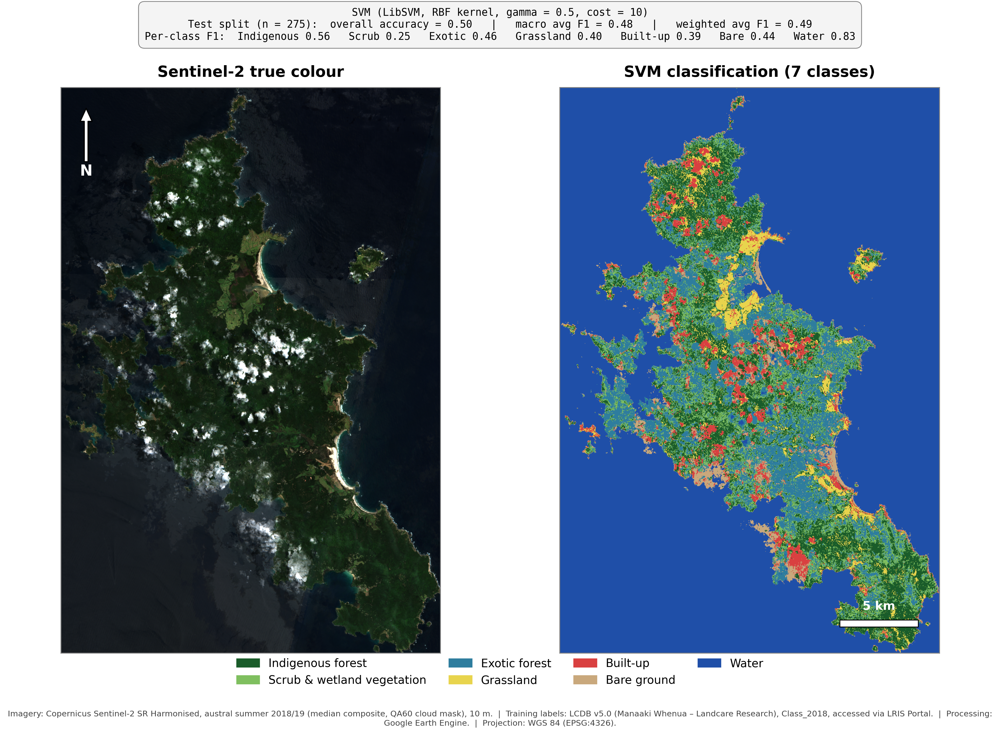

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [67]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import urllib.request, tempfile
import matplotlib.image as mpimg
import numpy as np

palette_gbi = [
    '1a5c2a',  # 1 Indigenous forest
    '7fbf5f',  # 2 Scrub & wetland veg
    '2e7d9e',  # 3 Exotic forest
    'e8d44d',  # 4 Grassland
    'd94040',  # 5 Built-up
    'c9a87c',  # 6 Bare ground
    '1f4fa8',  # 7 Water
]
names_gbi = [group_names[i] for i in range(1, 8)]

xmin, ymin, xmax, ymax = bounds
mid_lat = (ymin + ymax) / 2

# True color reference + classification results
url_rgb = s2_gbi.getThumbURL({
    'dimensions': 1200, 'region': aoi_gbi, 'format': 'png',
    'bands': ['B4','B3','B2'], 'min': 0, 'max': 0.3})

url_cls = classified_gbi.getThumbURL({
    'dimensions': 1200, 'region': aoi_gbi, 'format': 'png',
    'min': 1, 'max': 7, 'palette': palette_gbi})

# Output Image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 9), dpi=300)

for ax, url, title in [(ax1, url_rgb, 'Sentinel-2 true colour'),
                       (ax2, url_cls, 'SVM classification (7 classes)')]:
    with tempfile.NamedTemporaryFile(suffix='.png') as f:
        urllib.request.urlretrieve(url, f.name)
        ax.imshow(mpimg.imread(f.name), extent=[xmin, xmax, ymin, ymax])
    ax.set_title(title, fontsize=14, fontweight='bold', pad=10)
    ax.set_aspect(1 / np.cos(np.radians(abs(mid_lat))))   # Latitude correction
    ax.set_xticks([]); ax.set_yticks([])
    for s in ax.spines.values():
        s.set_edgecolor('grey'); s.set_linewidth(0.8)

# Compass (left image)
ax1.annotate('N',
             xy=(xmin + 0.018, ymax - 0.012),
             xytext=(xmin + 0.018, ymax - 0.048),
             arrowprops=dict(facecolor='white', edgecolor='black',
                             width=3.5, headwidth=11),
             ha='center', va='center', fontsize=14,
             color='white', fontweight='bold')

# Scale (Right Image)
km_per_deg = 111.32 * np.cos(np.radians(abs(mid_lat)))
bar_km = 5
bar_deg = bar_km / km_per_deg
bx = xmax - bar_deg - 0.015
by = ymin + 0.015
ax2.add_patch(plt.Rectangle((bx, by), bar_deg, 0.004,
                            facecolor='white', edgecolor='black', lw=0.8, zorder=5))
ax2.text(bx + bar_deg / 2, by + 0.010, f'{bar_km} km',
         ha='center', color='white', fontsize=11, fontweight='bold', zorder=5)

# Precision statistics box
stats_txt = (
    "SVM (LibSVM, RBF kernel, gamma = 0.5, cost = 10)\n"
    f"Test split (n = {len(y_true)}):  overall accuracy = {acc:.2f}   |   "
    f"macro avg F1 = {rep_d['macro avg']['f1-score']:.2f}   |   "
    f"weighted avg F1 = {rep_d['weighted avg']['f1-score']:.2f}\n"
    "Per-class F1:  " + "   ".join(
        f"{n.split()[0]} {rep_d[n]['f1-score']:.2f}" for n in names_gbi)
)
fig.text(0.5, 0.955, stats_txt, ha='center', fontsize=9.5, family='monospace',
         bbox=dict(boxstyle='round,pad=0.6', facecolor='#f4f4f4',
                   edgecolor='grey', lw=0.7))

# Illustration
handles = [mpatches.Patch(color='#'+c, label=n)
           for c, n in zip(palette_gbi, names_gbi)]
fig.legend(handles=handles, loc='lower center', ncol=4, fontsize=10.5,
           frameon=False, bbox_to_anchor=(0.5, 0.015))

# Data Source
attrib = ("Imagery: Copernicus Sentinel-2 SR Harmonised, austral summer 2018/19 "
          "(median composite, QA60 cloud mask), 10 m.  |  "
          "Training labels: LCDB v5.0 (Manaaki Whenua – Landcare Research), "
          "Class_2018, accessed via LRIS Portal.  |  "
          "Processing: Google Earth Engine.  |  Projection: WGS 84 (EPSG:4326).")
fig.text(0.5, -0.025, attrib, ha='center', fontsize=7.5,
         color='#444444', wrap=True)

plt.tight_layout(rect=[0, 0.06, 1, 0.93])
plt.savefig('q6_great_barrier_svm.png', dpi=300,
            bbox_inches='tight', facecolor='white')
plt.show()

from google.colab import files
files.download('q6_great_barrier_svm.png')